In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import display, clear_output
from PIL import Image

In [2]:
def draw_image2(image1, image2):
  plt.figure(figsize=(14,7), dpi=90)
  plt.subplot(1, 2, 1)
  plt.imshow(image1)
  plt.subplot(1, 2, 2)
  plt.imshow(image2)
  plt.show()

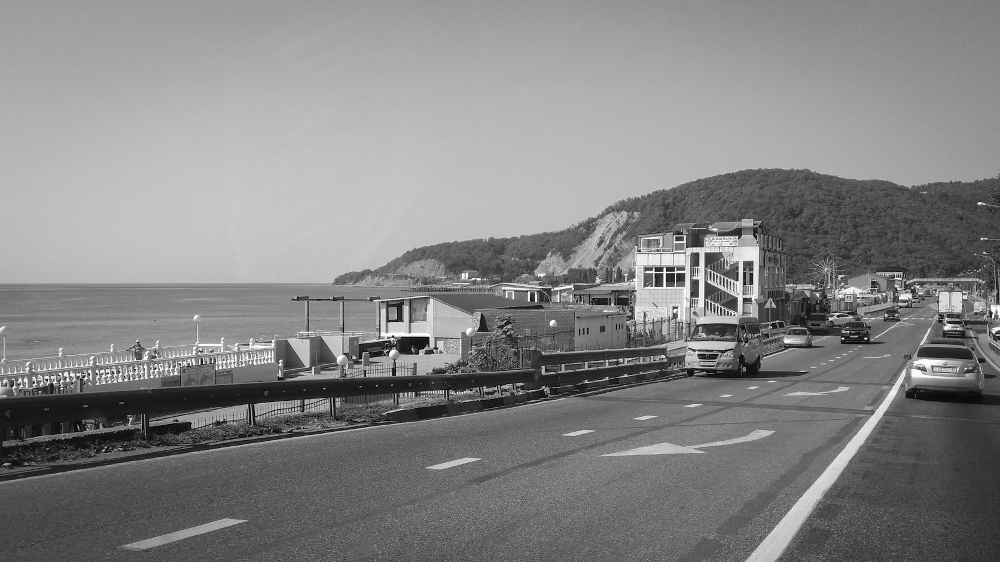

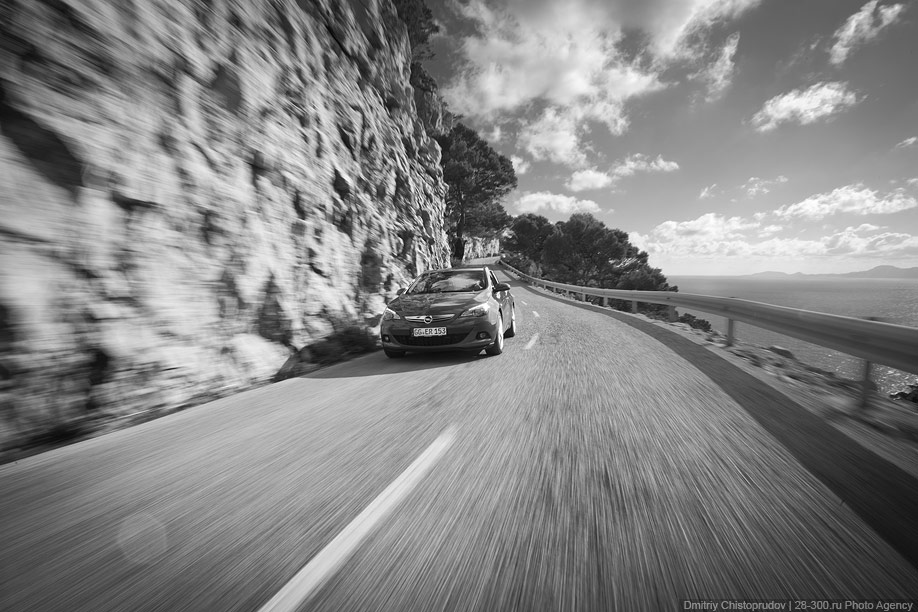

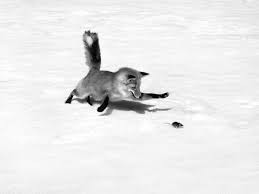

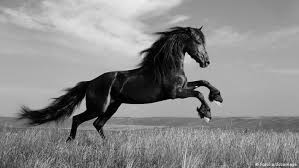

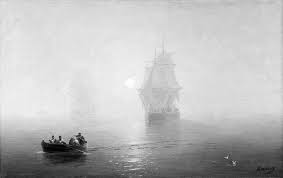

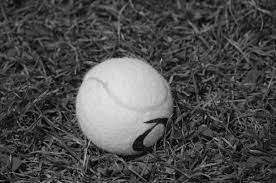

In [3]:
def show_gray(img):
    gray_image = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    display(Image.fromarray(gray_image))
    
    
img = cv2.imread('bus.jpg')
show_gray(img)
img = cv2.imread('car.jpg')
show_gray(img)
img = cv2.imread('fox.jpg')
show_gray(img)
img = cv2.imread('horse.jpg')
show_gray(img)
img = cv2.imread('A.jpg')
show_gray(img)
img = cv2.imread('tennis_ball.jpg')
show_gray(img)

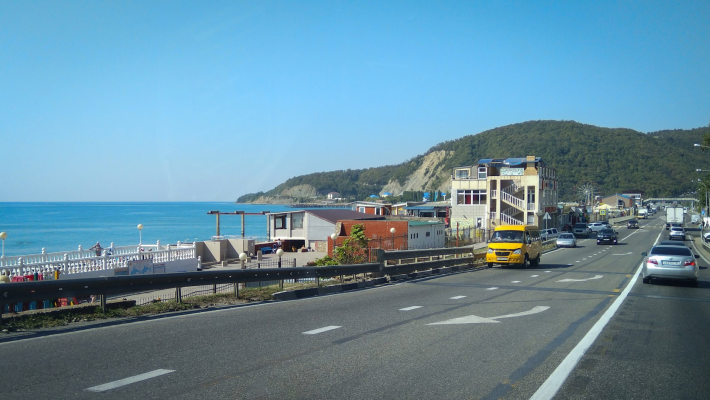

(400, 710, 3)


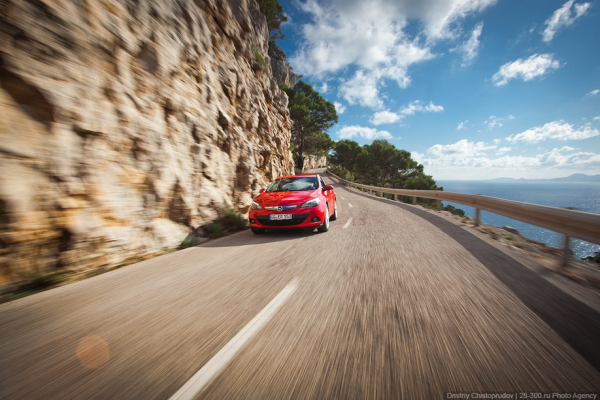

(400, 600, 3)


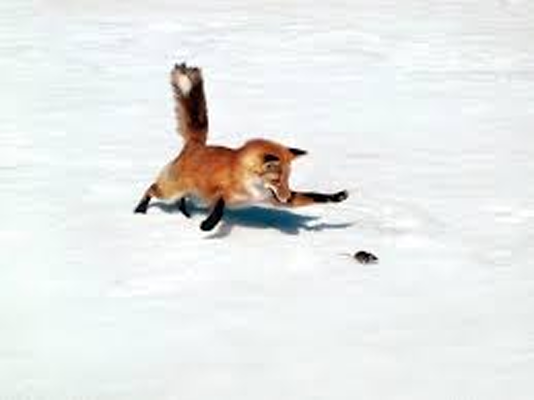

(400, 534, 3)


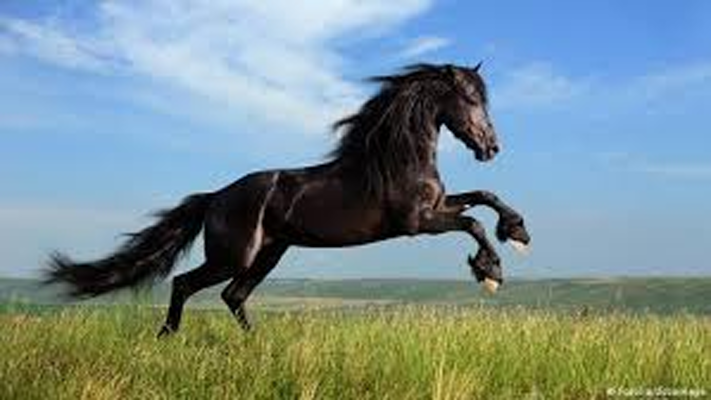

(400, 711, 3)


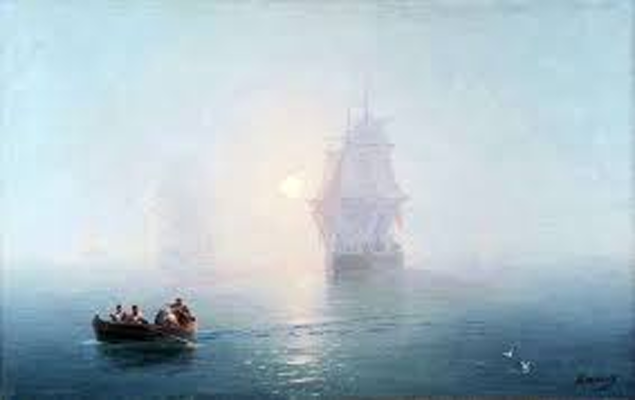

(400, 635, 3)


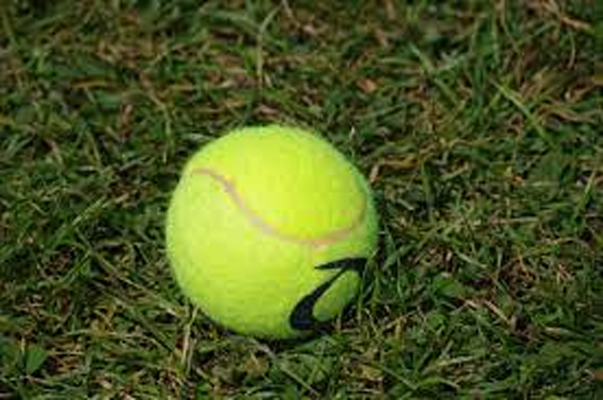

(400, 603, 3)


In [4]:
#изображение высотой в 400 пикселей. 
#Укажите, какую интерполяциюследует использовать для каждой картики (желательно, чтобывыборпроисходил автоматически).



def resize_img(img):
    final_h = 400
    if final_h<img.shape[0]:
        param = cv2.INTER_AREA
    else:
         param= cv2.INTER_CUBIC
    res_img = float(final_h) / img.shape[0]
    dim = (int(img.shape[1] * res_img),final_h)
    resized = cv2.resize(img, dim, interpolation = param)
    display(Image.fromarray(resized))
    print(resized.shape)
    
def change(img):
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

img = cv2.imread('bus.jpg')
resize_img(change(img))
img = cv2.imread('car.jpg')
resize_img(change(img))
img = cv2.imread('fox.jpg')
resize_img(change(img))
img = cv2.imread('horse.jpg')
resize_img(change(img))
img = cv2.imread('A.jpg')
resize_img(change(img))
img = cv2.imread('tennis_ball.jpg')
resize_img(change(img))

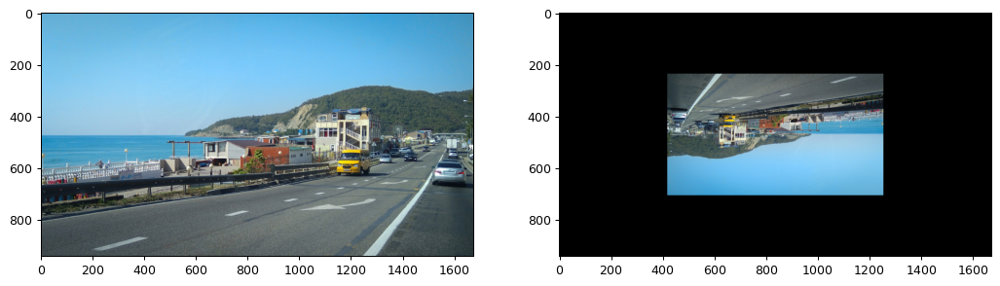

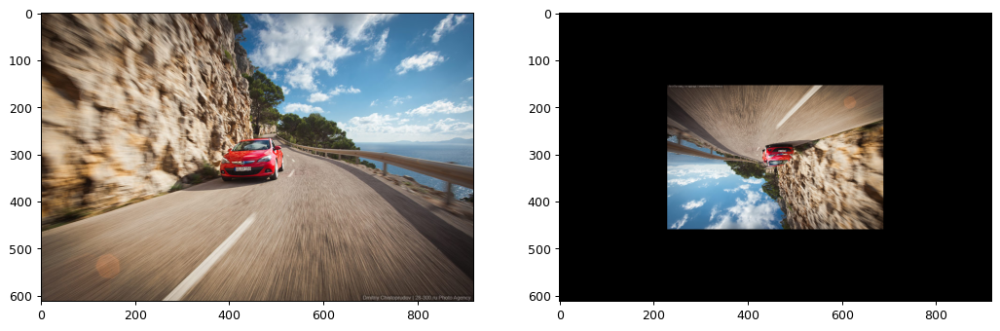

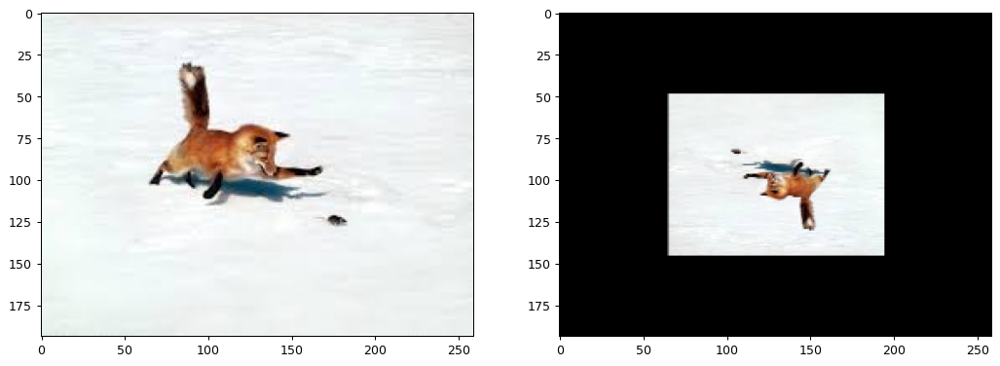

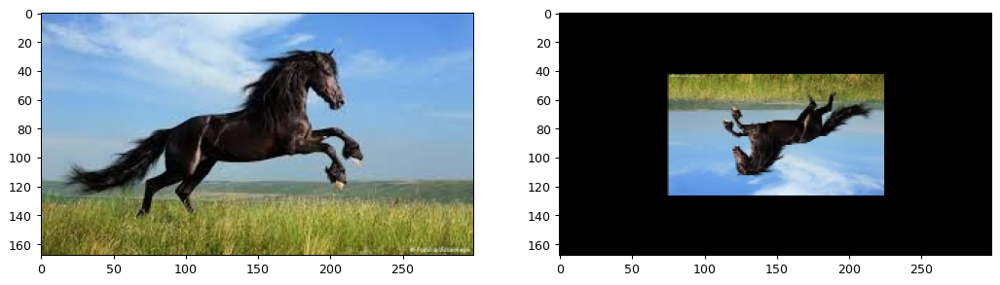

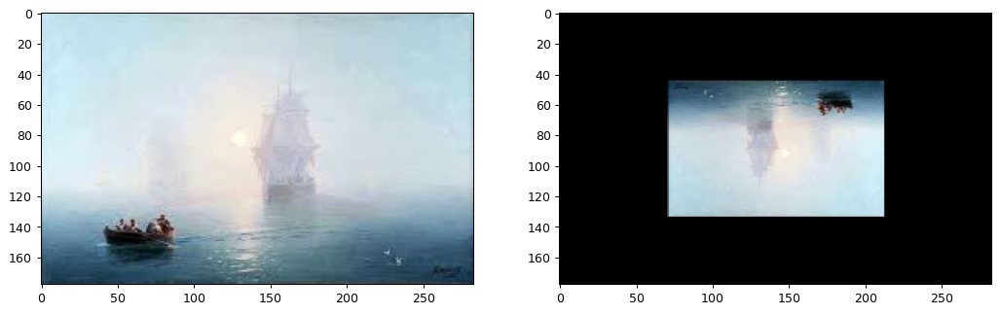

...

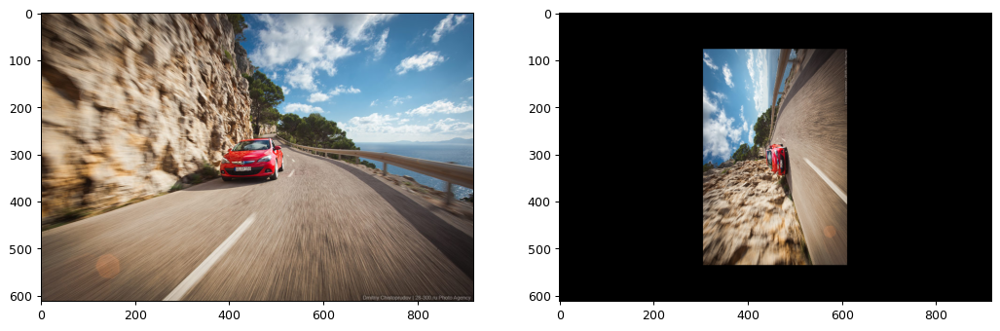

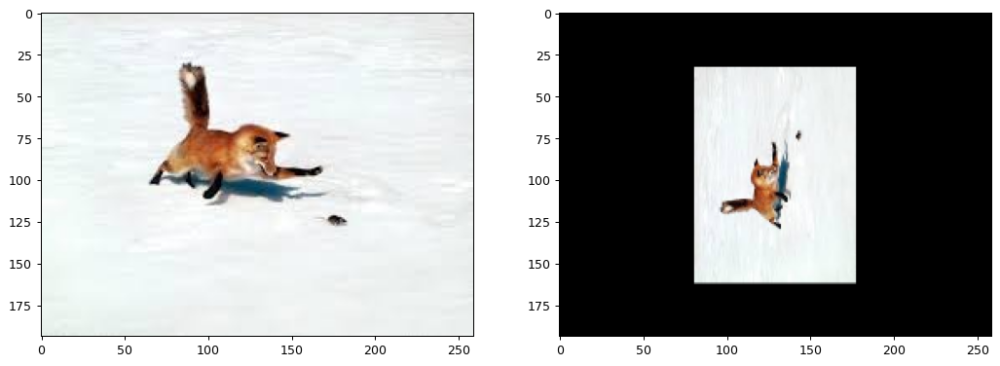

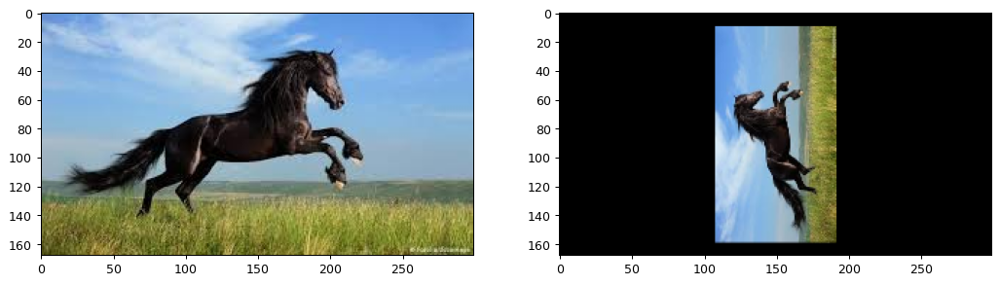

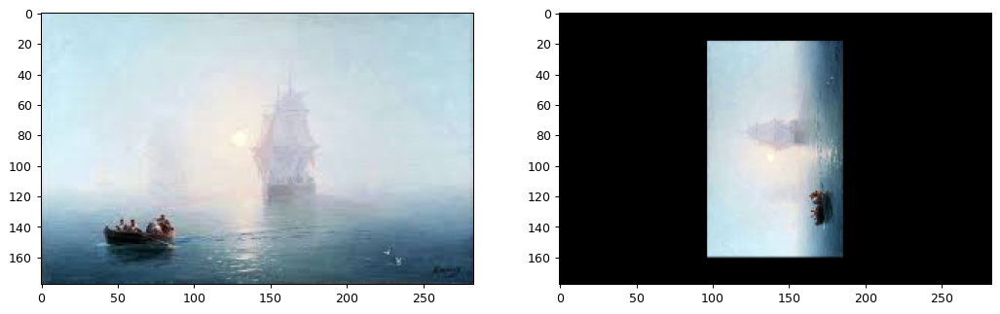

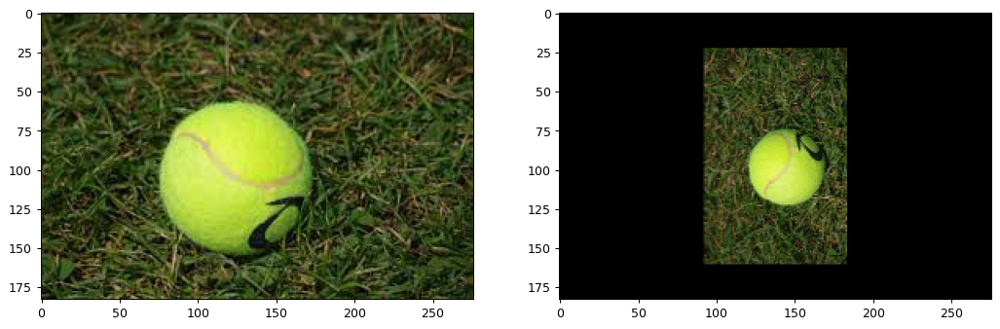

In [5]:
def rotate(img,angle):
    (h, w) = img.shape[:2]
    center = (w / 2, h / 2)

    # повернем изображение на 180 градусов
    M = cv2.getRotationMatrix2D(center, angle, 0.5)
    rotated = cv2.warpAffine(img, M, (w, h))
    draw_image2(img, rotated)

img = cv2.imread('bus.jpg')
rotate(change(img),180)
img = cv2.imread('car.jpg')
rotate(change(img),180)
img = cv2.imread('fox.jpg')
rotate(change(img),180)
img = cv2.imread('horse.jpg')
rotate(change(img),180)
img = cv2.imread('A.jpg')
rotate(change(img),180)
img = cv2.imread('tennis_ball.jpg')
rotate(change(img),180)
img = cv2.imread('bus.jpg')
rotate(change(img),90)
img = cv2.imread('car.jpg')
rotate(change(img),90)
img = cv2.imread('fox.jpg')
rotate(change(img),90)
img = cv2.imread('horse.jpg')
rotate(change(img),90)
img = cv2.imread('A.jpg')
rotate(change(img),90)
img = cv2.imread('tennis_ball.jpg')
rotate(change(img),90)

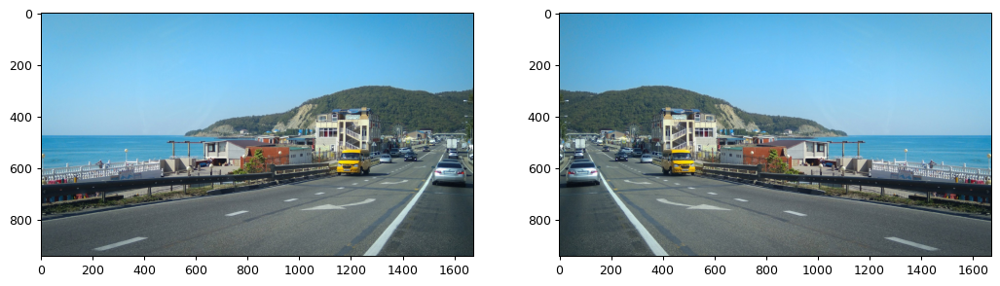

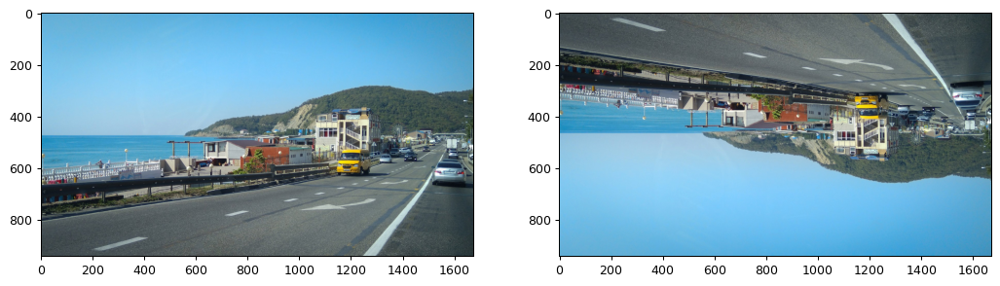

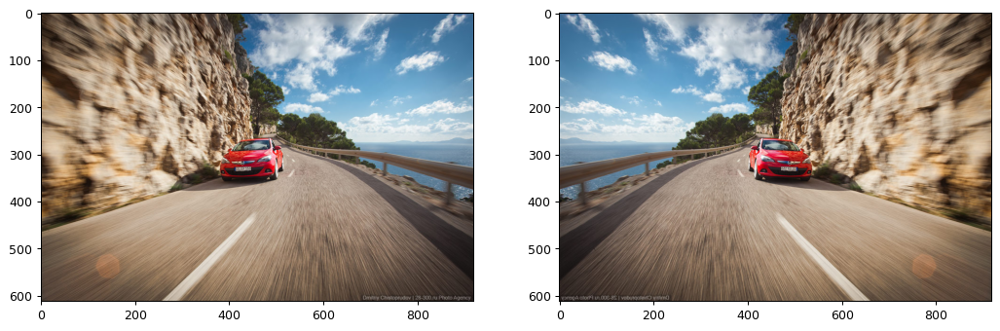

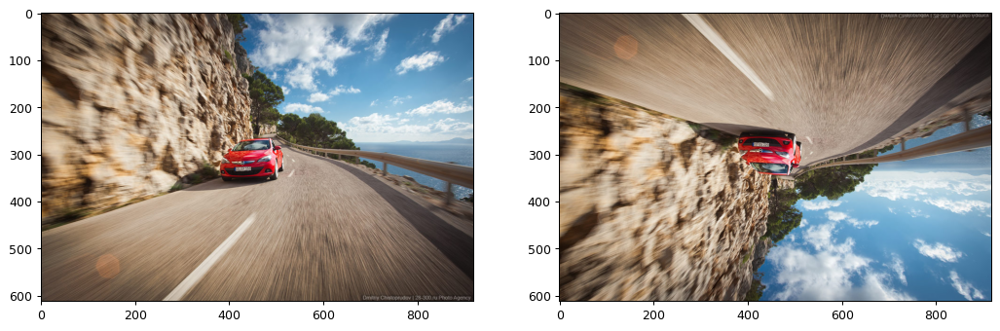

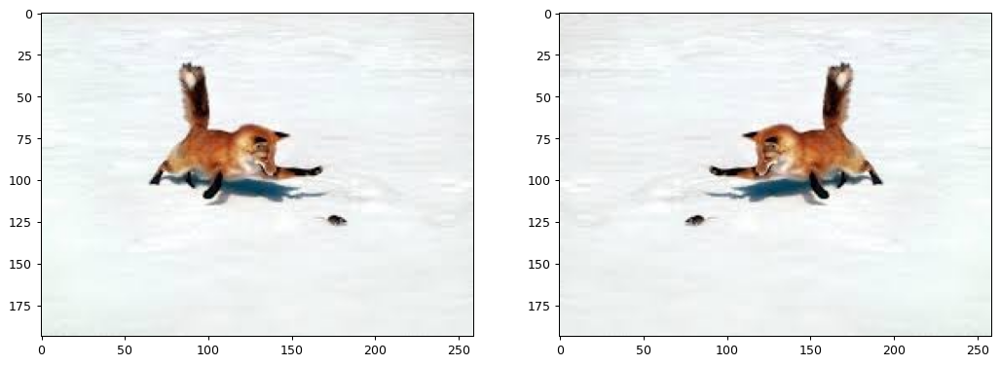

...

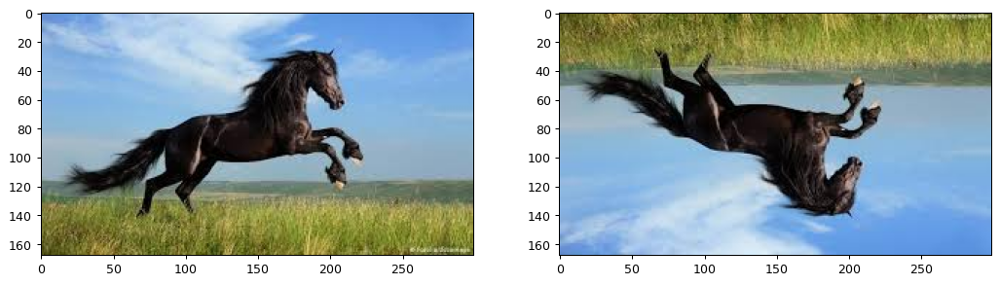

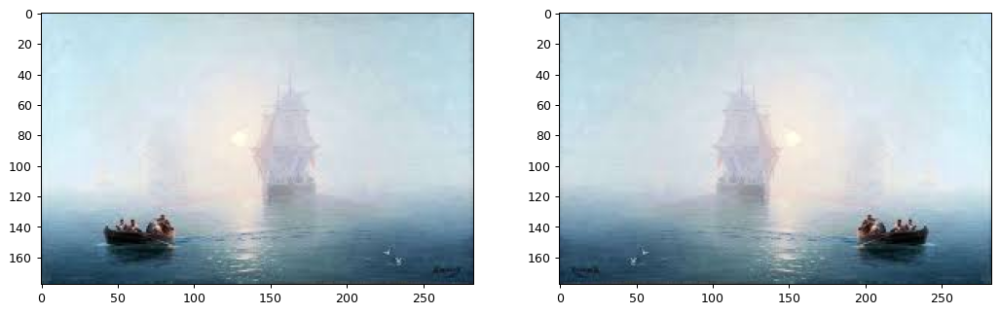

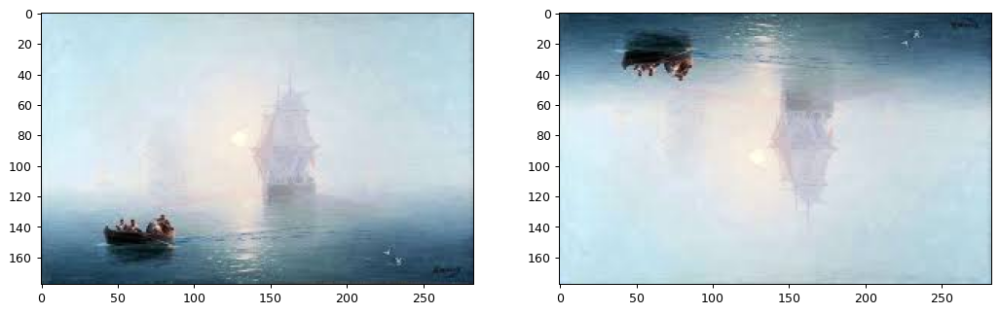

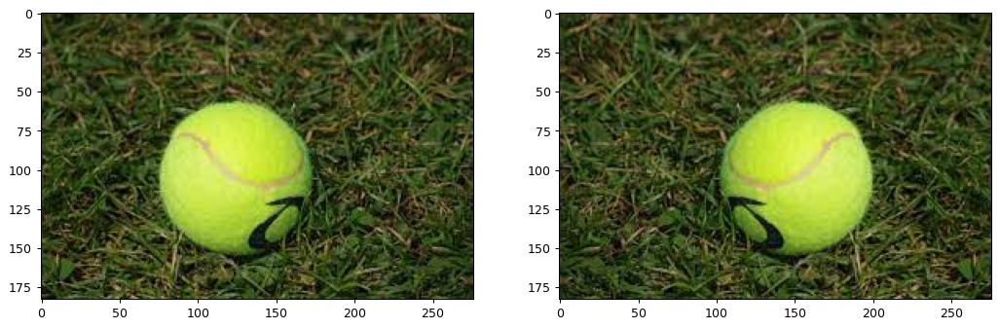

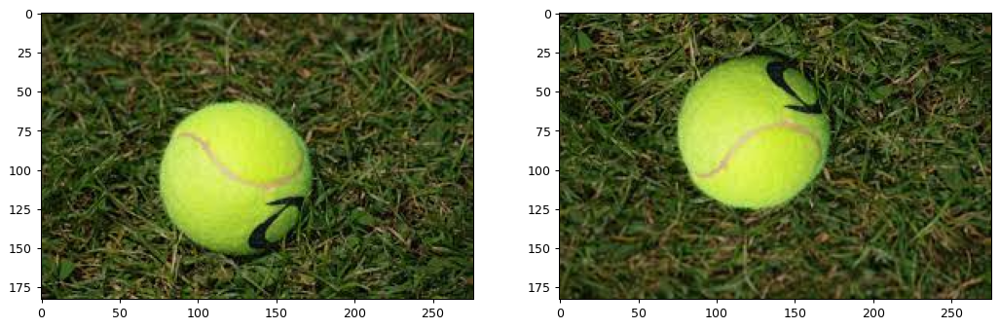

In [6]:
#верикальное и горизонтальное отражение изображения.
def flip(img):
    flip_image = cv2.flip(img,1)
    draw_image2(img, flip_image)
    flip_image = cv2.flip(img,0)
    draw_image2(img, flip_image)

img = cv2.imread('bus.jpg')
flip(change(img))
img = cv2.imread('car.jpg')
flip(change(img))
img = cv2.imread('fox.jpg')
flip(change(img))
img = cv2.imread('horse.jpg')
flip(change(img))
img = cv2.imread('A.jpg')
flip(change(img))
img = cv2.imread('tennis_ball.jpg')
flip(change(img))

In [7]:
import os
files = os.listdir()
fls = []
for i in range(len(files)):
  if files[i].endswith('.jpg') or files[i].endswith('.png'):
    fls.append(files[i])
fls
imgList = []
for i in range(len(fls)):
  imgList.append(cv2.imread(fls[i]))
imgListCpy = imgList.copy()
for i in range(len(imgListCpy)):
  procent = 400 / (imgListCpy[i].shape[0] / 100)
  imgListCpy[i] = cv2.resize(imgListCpy[i],(int((imgListCpy[i].shape[1] / 100 ) * procent), 400))
imgListHSV = []
for i in range(len(imgListCpy)):
  imgListHSV.append(cv2.cvtColor(imgListCpy[i], cv2.COLOR_BGR2HSV))

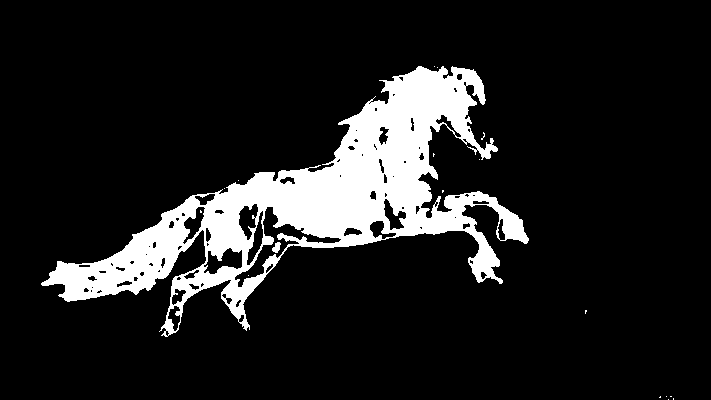

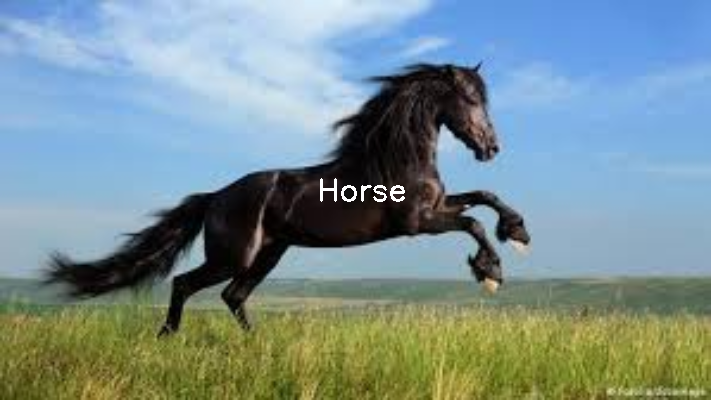

In [8]:
hrsImgHSV = imgListHSV[5]
hrsImgHSV = cv2.GaussianBlur(hrsImgHSV, (5,5), 0)
hrs_l = (0,10,0)
hrs_h = (180,150,90)
onlyHrs = cv2.inRange(hrsImgHSV, hrs_l, hrs_h)
display(Image.fromarray(onlyHrs))
moment = cv2.moments(onlyHrs, 1)
x_moment = moment['m01']
y_moment = moment['m10']
area = moment['m00']
x = int(x_moment / area)
y = int(y_moment / area)
img1 = cv2.putText(imgListCpy[5], "Horse", (y,x), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255) ,2)
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
display(Image.fromarray(img1))

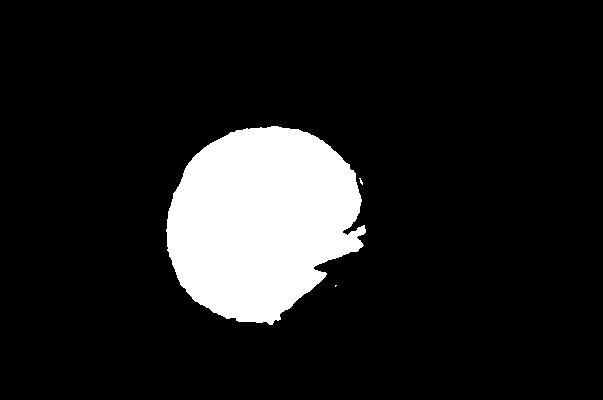

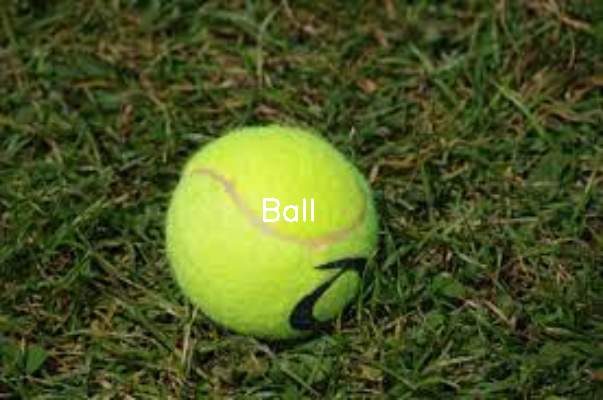

In [20]:
BalltImgHSV = imgListHSV[6]
BalltImgHSV = cv2.GaussianBlur(BalltImgHSV, (5,5), 0)
ball_l = (0,0,170)
ball_h = (180,255,255)
onlyBall = cv2.inRange(BalltImgHSV, ball_l, ball_h)
display(Image.fromarray(onlyBall))
moment = cv2.moments(onlyBall, 1)
x_moment = moment['m01']
y_moment = moment['m10']
area = moment['m00']
x = int(x_moment / area)
y = int(y_moment / area)
img1 = cv2.putText(imgListCpy[6], "Ball", (y,x), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255) ,2)
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
display(Image.fromarray(img1))


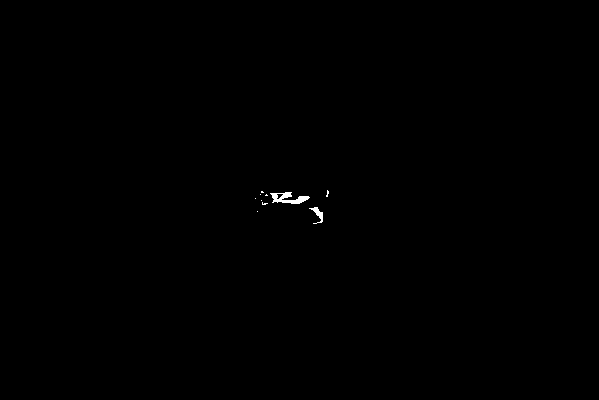

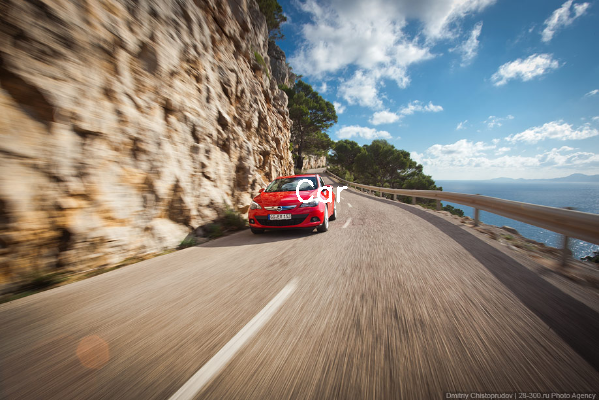

In [21]:
CarImgHSV = imgListHSV[2]
CarImgHSV = cv2.GaussianBlur(CarImgHSV, (5,5), 0)
Car_l = (5,180,170)
Car_h = (180,255,255)
onlyCar = cv2.inRange(CarImgHSV, Car_l, Car_h)
display(Image.fromarray(onlyCar))
moment = cv2.moments(onlyCar, 1)
x_moment = moment['m01']
y_moment = moment['m10']
area = moment['m00']
x = int(x_moment / area)
y = int(y_moment / area)
img1 = cv2.putText(imgListCpy[2], "Car", (y,x), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255) ,2)
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
display(Image.fromarray(img1))

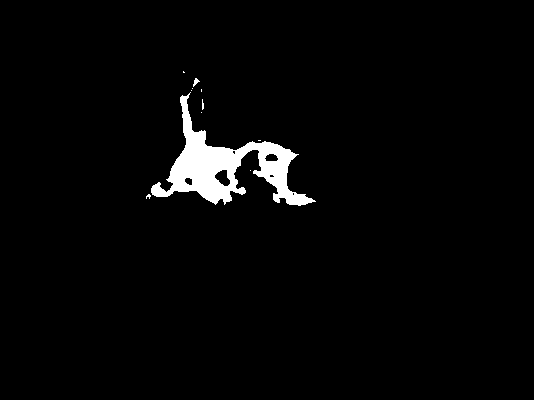

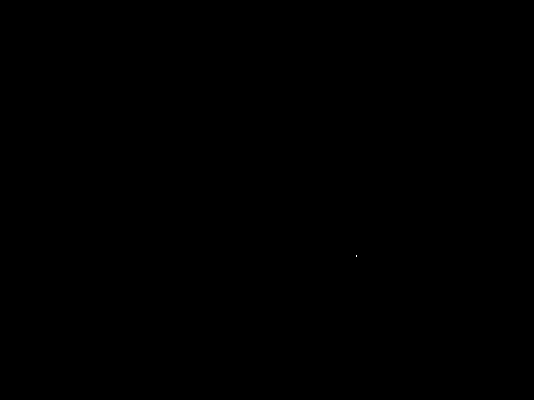

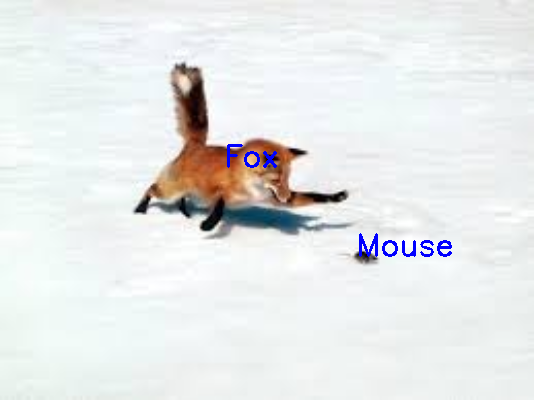

In [15]:
FoxImgHSV = imgListHSV[4]
FoxImgHSV = cv2.GaussianBlur(FoxImgHSV, (5,5), 0)
fox_l = (6,100,60)
fox_h = (20,255,200)
mouse_l = (10,35,81)
mouse_h = (15,35,100)
onlyFox = cv2.inRange(FoxImgHSV, fox_l, fox_h)
onlyMouse = cv2.inRange(FoxImgHSV, mouse_l, mouse_h)
display(Image.fromarray(onlyFox))
display(Image.fromarray(onlyMouse))

ObjHSV = [onlyFox,onlyMouse]
ObjList = []
Name = ["Fox","Mouse"]
for i in range(2):
  moment = cv2.moments(ObjHSV[i], 1)
  x_moment = moment['m01']
  y_moment = moment['m10']
  area = moment['m00']
  x = int(x_moment / area)
  y = int(y_moment / area)
  ObjList.append((y,x))
  img1 = cv2.putText(imgListCpy[4], Name[i], ObjList[i], cv2.FONT_HERSHEY_SIMPLEX, 1, (255,0,0) ,2)
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
display(Image.fromarray(img1))

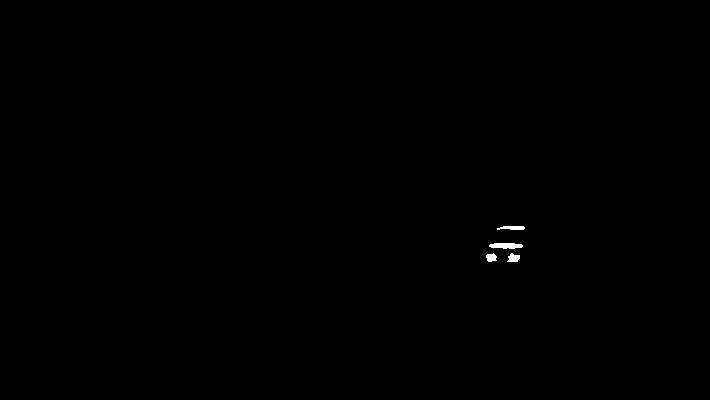

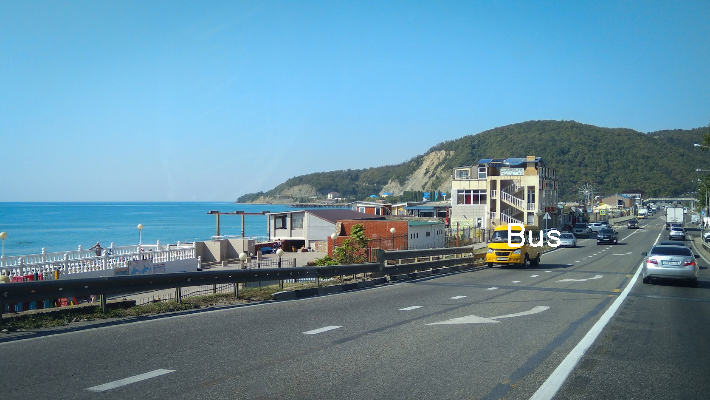

In [22]:
busImgHSV = imgListHSV[1]
busImgHSV = cv2.GaussianBlur(busImgHSV, (5,5), 0)
bus_l = (10,190,0)
bus_h = (70,255,255)
onlyBus = cv2.inRange(busImgHSV, bus_l, bus_h)
display(Image.fromarray(onlyBus))
moment = cv2.moments(onlyBus, 1)
x_moment = moment['m01']
y_moment = moment['m10']
area = moment['m00']
x = int(x_moment / area)
y = int(y_moment / area)
img1 = cv2.putText(imgListCpy[1], "Bus", (y,x), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255) ,2)
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)


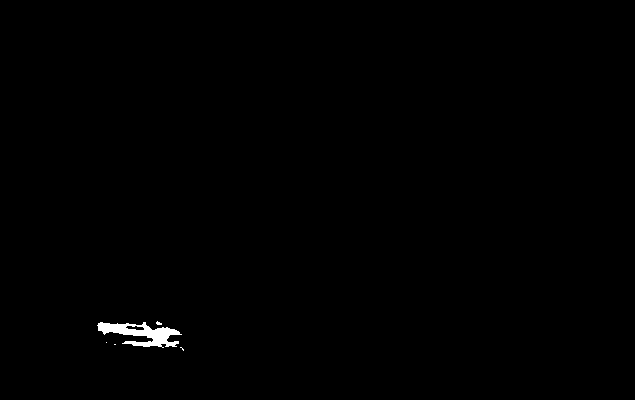

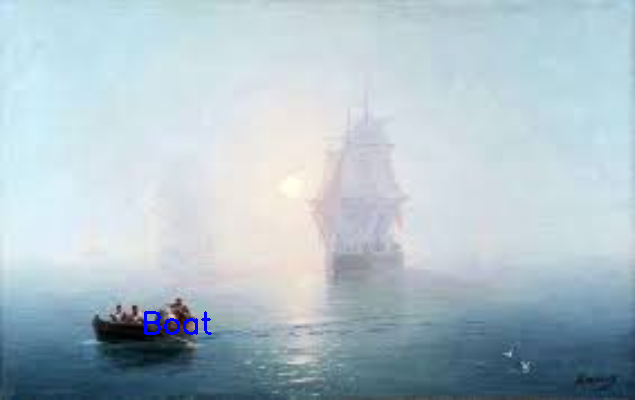

In [25]:
BoatImgHSV = imgListHSV[0]
BoatImgHSV = cv2.GaussianBlur(BoatImgHSV, (5,5), 0)
boat_l = (0,0,5)
boat_h = (180,120,50)
onlyBoat = cv2.inRange(BoatImgHSV, boat_l, boat_h)
display(Image.fromarray(onlyBoat))
moment = cv2.moments(onlyBoat, 1)
x_moment = moment['m01']
y_moment = moment['m10']
area = moment['m00']
x = int(x_moment / area)
y = int(y_moment / area)
img1 = cv2.putText(imgListCpy[0], "Boat", (y,x), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,0,0) ,2)
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
display(Image.fromarray(img1))

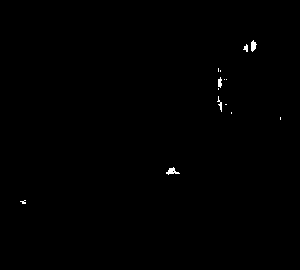

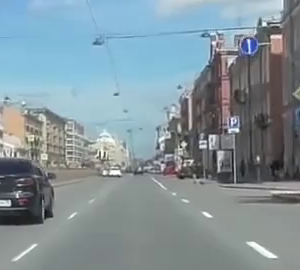

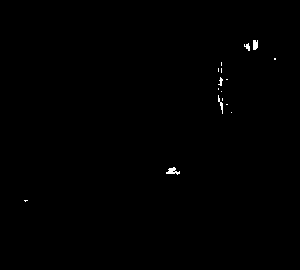

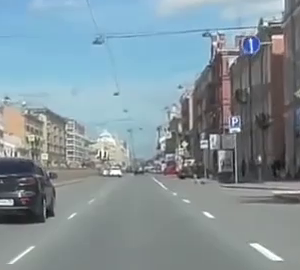

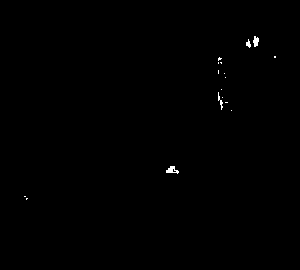

...

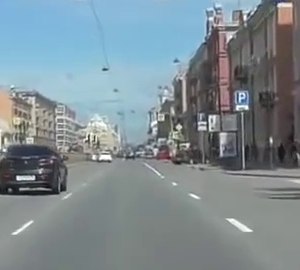

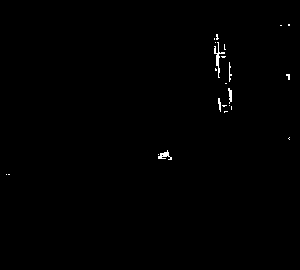

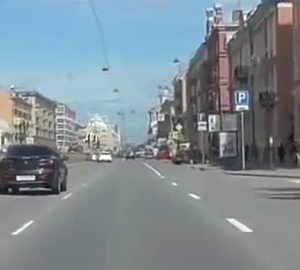

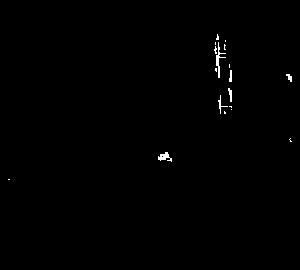

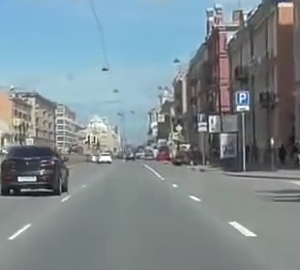

In [4]:
capImg = cv2.VideoCapture('Инструктор.mp4') #связываем видеопоток с переменной
count = 0
while(capImg.isOpened()): #открываем файл с видео
  count += 1
  ret, frame = capImg.read() #получаем кадры из видеопотока файла, по очереди считываются в переменную frame
  if frame is None or count > 30: #если кадры закончились, то прерываем цикл
    break
  frame_hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV) #переводим кадр в цветовое hsv-пространство
  crop_frame = frame[200:470, 550:850] #делаем  вырезку области кадра, где ожидается объект
  crop_frame_hsv = frame_hsv[200:470, 550:850]
  #задаем нижнюю  и верхнюю границы цветового фильтра с помощью массивов numpy

  #цвет 0.....180
  #насыщенност 0 - блеклый, 255 - насыщенный
  #яркость 0 - темный, 255 - светлый

  low_blue = np.array([105,150,0], dtype = "uint8") #фильтр для синего цвета
  high_blue = np.array([135,255,210], dtype = "uint8")

  low_yel = np.array([10,150,100], dtype = "uint8") #фильтр для желтого цвета
  high_yel = np.array([50,255,255], dtype = "uint8")

  low_red_o = np.array([0,85,110], dtype = "uint8") #фильтр для красного цвета в сторону оранжевой области
  high_red_o = np.array([5,165,155], dtype = "uint8")
  low_red_v = np.array([165,55,40], dtype = "uint8") #фильтр для красного цвета в стророну фиолетовой области
  high_red_v = np.array([180,105,120], dtype = "uint8")

  #применяем маску по цвету к фрагменту кадра
  blue_mask = cv2.inRange(crop_frame_hsv, low_blue, high_blue)
  yel_mask = cv2.inRange(crop_frame_hsv, low_yel, high_yel)
  redo_mask = cv2.inRange(crop_frame_hsv, low_red_o, high_red_o)
  redv_mask = cv2.inRange(crop_frame_hsv, low_red_v, high_red_v)

  full_mask = blue_mask + yel_mask + redo_mask + redv_mask

  #показываем области кадров с объектом
  #в окне video_mask результат наложения маски
  display(Image.fromarray(full_mask))
  #в окне video_frame вырезку из кадра
  crop_frame = cv2.cvtColor(crop_frame, cv2.COLOR_BGR2RGB)
  display(Image.fromarray(crop_frame))